# Simulator demo

In [1]:
from common import Config, State, generate_pyplot_animation
from simulator import CartPoleSimulator
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML

In [2]:
def utraj_old(time_step, duration):
    timestamps = [0.0]
    targets = []
    
    for timestamp in np.arange(time_step, duration, time_step):
        timestamps.append(timestamp)
        target = (3 * (np.cos(timestamp ** 1.5)/(timestamp ** 0.5) 
                      - 2.60* (timestamp ** 1) * np.sin(timestamp ** 1.5)))/3.2
        targets.append(target)
        
    timestamps.pop()
    
    return timestamps, targets

In [3]:
def acc_change_duration(a0, l0, moves_num):
    t0 = (l0 / a0) ** 0.5
    
    change_ts = [t0]
    
    for i in range(moves_num):
        t = t0 * ((2 / (i + 2)) ** 0.5)
        change_ts.append(t) 
    
    return change_ts

In [4]:
def utraj(time_step, moves_num):
    timestamps = []
    targets = []
    
    a0 = config.max_acceleration / ((moves_num + 1) * 1.1)
    l0 = config.max_position * 0.9
    
    a = a0
    time = 0
    acc_duration = acc_change_duration(a0, l0, moves_num)
    
    for i in range(moves_num + 1):
        for j in range(int(acc_duration[i] / time_step)):
            timestamps.append(time)
            time += time_step
            targets.append(a)
            
        a = -a
        
        for j in range(int(acc_duration[i] / time_step)):
            timestamps.append(time)
            time += time_step
            targets.append(a)
        
        a *= ((i+2)/(i+1))
        
    return timestamps, targets

In [5]:
init = State.home()
config = Config()
simulator = CartPoleSimulator()
simulator.reset_to(config, init)

states = []
time_step = 0.02
moves_num = 5 

timestamps, targets = utraj(time_step, moves_num)

for target in targets:
    simulator.set_target(target)
    state = simulator.get_state()
    states.append(state)
    simulator.advance(time_step)

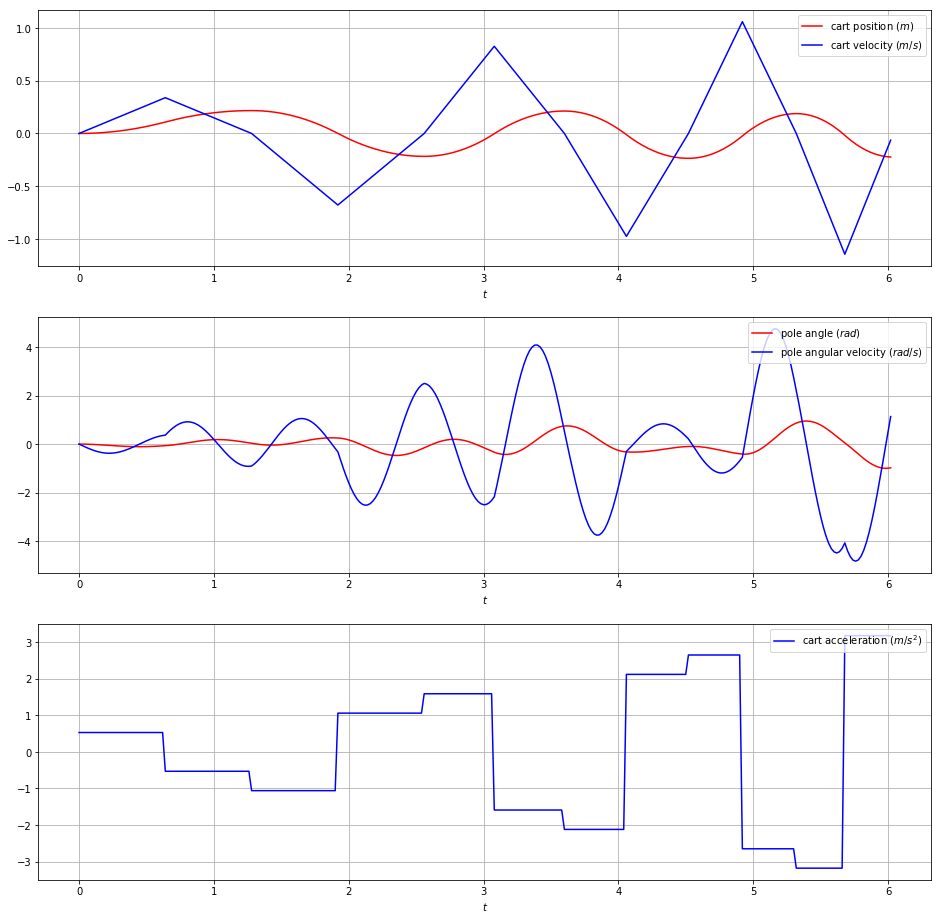

In [10]:
data = np.array([state.as_tuple() for state in states])

fig, ax = plt.subplots(3, 1, figsize=(16, 16))

ax[0].plot(timestamps, data[:, 0], c='r', label='cart position ($m$)')
ax[0].plot(timestamps, data[:, 2], c='blue', label='cart velocity ($m/s$)')
ax[1].plot(timestamps, data[:, 1], c='r', label=r'pole angle ($rad$)')
ax[1].plot(timestamps, data[:, 3], c='blue', label=r'pole angular velocity ($rad/s$)')
ax[2].plot(timestamps, targets, c='blue', label=r'cart acceleration ($m/s^2$)')


for i in range(3):
    ax[i].legend(loc='upper right')
    ax[i].set_xlabel(r'$t$')
    ax[i].grid()

In [11]:
anim = generate_pyplot_animation(config, states, timestamps=timestamps)
HTML(anim.to_jshtml())